# Image Transformation

Image transformation is used here to refer to the process of altering the appearance or content of an image using various mathematical and algorithmic techniques. This section talks about contrast related methods, geometric transformations, morphological operations.

## Contrast related methods
Suppose one wants to enhance the contrast an image. This can be achieved by simply choosing an appropriate algorithm and calling adjust_histogram or adjust_histogram! in the image. The contrast will be automatically enhanced.

In [1]:
using Images, TestImages, Plots

[ Info: Precompiling Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80]
[ Info: Precompiling FileIOExt [f5f51d8f-5827-5d2e-939b-192fcd6ec70c]
[ Info: Precompiling IJuliaExt [2f4121a4-3b3a-5ce6-9c5e-1f2673ce168a]


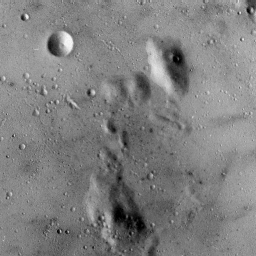

In [63]:
img = testimage("moonsurface")

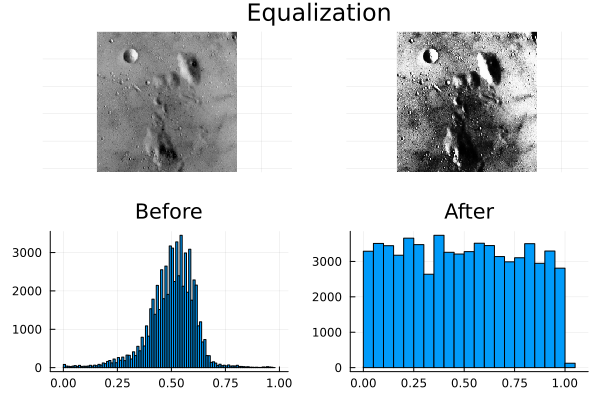

In [78]:
alg = Equalization(nbins = 256)
img_adjusted = adjust_histogram(img, alg);
hist_final = [histogram(vec(Float32.(img))) for img in [img, img_adjusted]]
p1 = plot(img,axis=false)
p2 = plot(img_adjusted,axis=false)
p3 = plot(p1,p2)
p4 = plot(hist_final...,layout = (1,2), size = (512, 256), legend = false, title = ["Before" "After"])
plot(p3,p4;layout=(2,1),plot_title="Equalization")

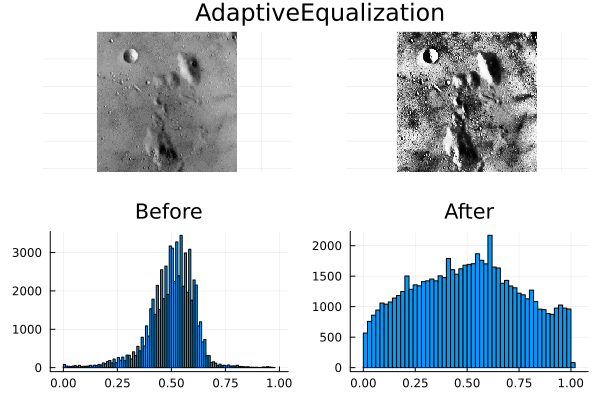

In [67]:
alg = AdaptiveEqualization(nbins = 256, rblocks = 4, cblocks = 4, clip = 0.2)
img_adjusted = adjust_histogram(img, alg);
hist_final = [histogram(vec(Float32.(img))) for img in [img, img_adjusted]]
p1 = plot(img,axis=false)
p2 = plot(img_adjusted,axis=false)
p3 = plot(p1,p2)
p4 = plot(hist_final...,layout = (1,2), size = (512, 256), legend = false, title = ["Before" "After"])
plot(p3,p4;layout=(2,1),plot_title="AdaptiveEqualization")

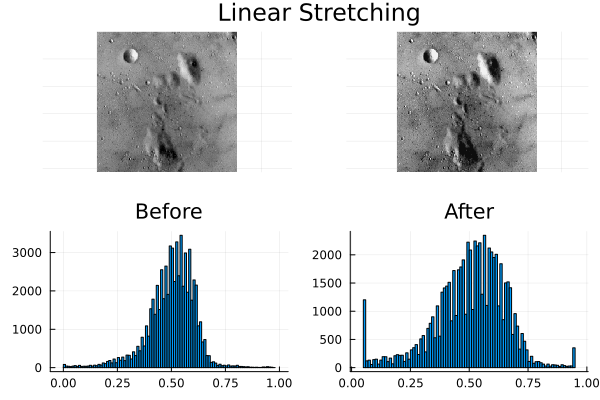

In [71]:
# first generate an algorithm instance
alg = LinearStretching((0.3,0.7) =>(0.05,0.95))
img_adjusted = adjust_histogram(img, alg);
hist_final = [histogram(vec(Float32.(img))) for img in [img, img_adjusted]]
p1 = plot(img,axis=false)
p2 = plot(img_adjusted,axis=false)
p3 = plot(p1,p2)
p4 = plot(hist_final...,layout = (1,2), size = (512, 256), legend = false, title = ["Before" "After"])
plot(p3,p4;layout=(2,1),plot_title="Linear Stretching")

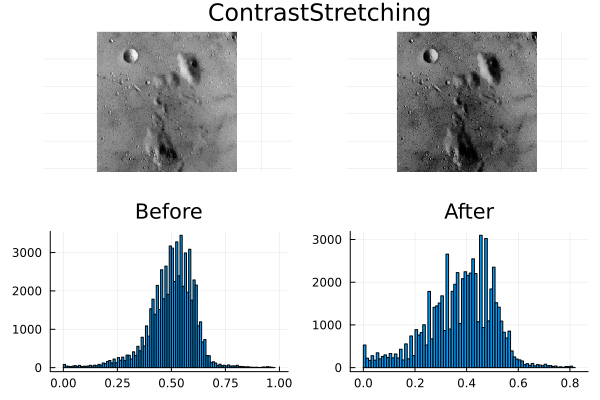

In [73]:
alg = ContrastStretching(t = 0.6, slope = 3)
img_adjusted = adjust_histogram(img, alg);
hist_final = [histogram(vec(Float32.(img))) for img in [img, img_adjusted]]
p1 = plot(img,axis=false)
p2 = plot(img_adjusted,axis=false)
p3 = plot(p1,p2)
p4 = plot(hist_final...,layout = (1,2), size = (512, 256), legend = false, title = ["Before" "After"])
plot(p3,p4;layout=(2,1),plot_title="ContrastStretching")

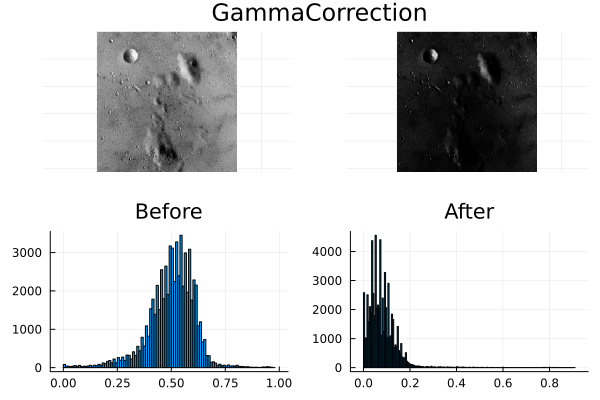

In [77]:
alg = GammaCorrection(gamma = 4)

img_adjusted = adjust_histogram(img, alg);
hist_final = [histogram(vec(Float32.(img))) for img in [img, img_adjusted]]
p1 = plot(img,axis=false)
p2 = plot(img_adjusted,axis=false)
p3 = plot(p1,p2)
p4 = plot(hist_final...,layout = (1,2), size = (512, 256), legend = false, title = ["Before" "After"])
plot(p3,p4;layout=(2,1),plot_title="GammaCorrection")

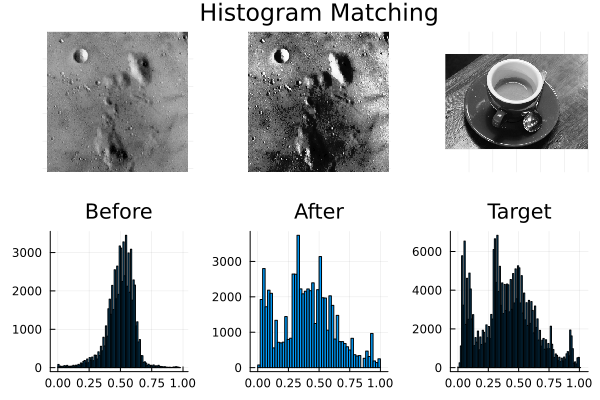

In [90]:
img_target = Gray.(testimage("coffee"))
alg = Matching(targetimg = img_target)

img_adjusted = adjust_histogram(img, alg);
hist_final = [histogram(vec(Float32.(img))) for img in [img, img_adjusted, img_target]]
p1 = plot(img,axis=false)
p2 = plot(img_adjusted,axis=false)
p3 = plot(img_target,axis=false)
p3 = plot(p1,p2,p3,layout=(1,3))
p4 = plot(hist_final...,layout = (1,3), size = (512, 256), legend = false, title = ["Before" "After" "Target"])
plot(p3,p4;layout=(2,1),plot_title="Histogram Matching")

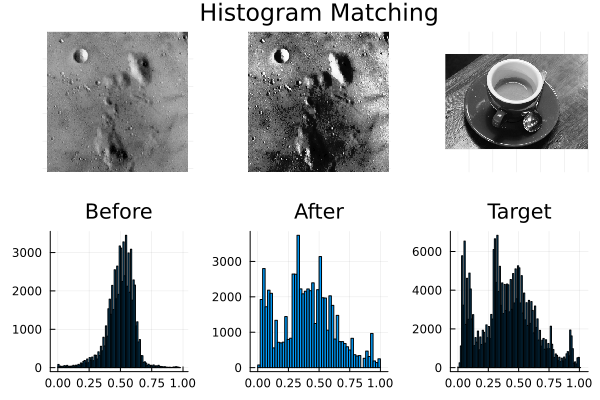

In [91]:
img_target = Gray.(testimage("coffee"))
alg = Matching(targetimg = img_target)

img_adjusted = adjust_histogram(img, alg);
hist_final = [histogram(vec(Float32.(img))) for img in [img, img_adjusted, img_target]]
p1 = plot(img,axis=false)
p2 = plot(img_adjusted,axis=false)
p3 = plot(img_target,axis=false)
p3 = plot(p1,p2,p3,layout=(1,3))
p4 = plot(hist_final...,layout = (1,3), size = (512, 256), legend = false, title = ["Before" "After" "Target"])
plot(p3,p4;layout=(2,1),plot_title="Histogram Matching")

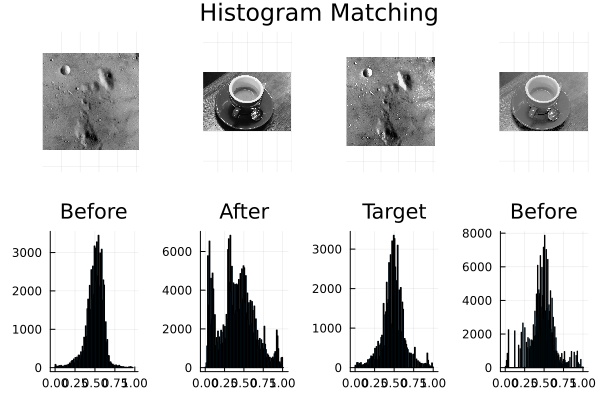

In [94]:
alg = MidwayEqualization(nbins = 256)
img_sequence = adjust_histogram([img, img_target],alg)
img1 = first(img_sequence)
img2 = last(img_sequence)

p1 = plot(img,axis=false)
p2 = plot(img_target,axis=false)
p3 = plot(img1, axis=false)
p4 = plot(img2, axis=false)
p5 = plot(p1,p2,p3,p4, layout=(1,4))
hist_final = [histogram(vec(Float32.(img))) for img in [img, img_target, img1, img2]]
p6 = plot(hist_final...,layout = (1,4), size = (512, 256), legend = false, title = ["Before" "After" "Target"])
plot(p5,p6;layout=(2,1),plot_title="Histogram Matching")

## Geometric Transformations

In [ ]:
#left to do

## Morphological Operations

Morphological image processing is an area of computer vision which pursues to remove imperfections from binary and grayscale images.

Images.jl utilizese ImageMorphology.jl to provide support morphological functions. ImageMorphology.jl holds a collection of non-linear operations related to the shape or morphology of features in an image.

In [1]:
using Pkg
Pkg.activate(".")
Pkg.instantiate()

  Activating project at `C:\Users\lenono\Documents\StudyCode\JuliaCon23_ImageProcessingWorkshop`


# Introduction

In [11]:
using Images, TestImages

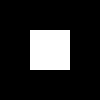

In [55]:
img = zeros(10, 10); img[4:7, 4:7] .= 1.; 
img = Gray.(img)

# Erosion
Erode performs a min-filter over its nearest-neighbors. The default is 8-connectivity in 2d, 27-connectivity in 3d, etc. You can specify the list of dimensions that you want to include in the connectivity, e.g., region = [1,2] would exclude the third dimension from filtering.

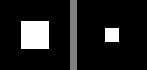

In [56]:
img_erode = erode(img)
mosaic(img, img_erode; nrow = 1, fillvalue=.5, npad=1)

# Dilation
Dilate performs a max-filter over its nearest-neighbors

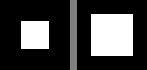

In [57]:
img_dilate = dilate(img)
mosaic(img, img_dilate; nrow = 1, fillvalue=.5, npad=1)

# Opening
Opening morphology operation is equivalent to dilate(erode(img)). In opening(img, [region]), region allows you to control the dimensions over which this operation is performed. Opening can remove small bright spots (i.e. “salt”) and connect small dark cracks.

┌ Info: img:
│   img =
│    5×5 Matrix{Float64}:
│     1.0  0.0  0.0  0.0  0.0
│     0.0  0.0  0.0  0.0  0.0
│     0.0  0.0  1.0  1.0  1.0
│     0.0  0.0  1.0  1.0  1.0
└     0.0  0.0  1.0  1.0  1.0


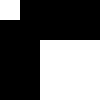

In [88]:
img = zeros(5, 5); img[1, 1] = 1.; img[3:5, 3:5] .= 1.; 
@info "img:" img
Gray.(img)

┌ Info: opening:
│   opening(img) =
│    5×5 Matrix{Float64}:
│     0.0  0.0  0.0  0.0  0.0
│     0.0  0.0  0.0  0.0  0.0
│     0.0  0.0  1.0  1.0  1.0
│     0.0  0.0  1.0  1.0  1.0
└     0.0  0.0  1.0  1.0  1.0


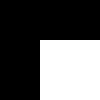

In [87]:
@info "opening:" opening(img)
Gray.(opening(img))

# Closing
Closing morphology operation is equivalent to erode(dilate(img)). In closing(img, [region]), region allows you to control the dimensions over which this operation is performed. Closing can remove small dark spots (i.e. “pepper”) and connect small bright cracks.

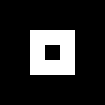

In [92]:
img = zeros(7, 7); img[3:5, 3:5] .= 1.; img[4, 4] = 0.; img
Gray.(img)

┌ Info: result:
│   closing(img) =
│    7×7 Matrix{Float64}:
│     0.0  0.0  0.0  0.0  0.0  0.0  0.0
│     0.0  0.0  0.0  0.0  0.0  0.0  0.0
│     0.0  0.0  1.0  1.0  1.0  0.0  0.0
│     0.0  0.0  1.0  1.0  1.0  0.0  0.0
│     0.0  0.0  1.0  1.0  1.0  0.0  0.0
│     0.0  0.0  0.0  0.0  0.0  0.0  0.0
└     0.0  0.0  0.0  0.0  0.0  0.0  0.0


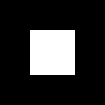

In [93]:
@info "result:" closing(img)
Gray.(closing(img))

# Tophat
Tophat is defined as the image minus its morphological opening. In tophat(img, [region]), region allows you to control the dimensions over which this operation is performed. This operation returns the bright spots of the image that are smaller than the structuring element.

In [97]:
img = zeros(5, 5); img[1, 1] = 1.; img[3:5, 3:5] .= 1.; img

5×5 Matrix{Float64}:
 1.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0
 0.0  0.0  1.0  1.0  1.0
 0.0  0.0  1.0  1.0  1.0
 0.0  0.0  1.0  1.0  1.0

In [98]:
tophat(img)

5×5 Matrix{Float64}:
 1.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0

# Bottom Hat
Bottom Hat morphology operation is defined as image's morphological closing minus the original image. In bothat(img, [region]), region allows you to control the dimensions over which this operation is performed. This operation returns the dark spots of the image that are smaller than the structuring element.

In [104]:
img = zeros(7, 7); img[3:5, 3:5] .= 1.; img[4, 4] = 0.; img

7×7 Matrix{Float64}:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  1.0  1.0  1.0  0.0  0.0
 0.0  0.0  1.0  0.0  1.0  0.0  0.0
 0.0  0.0  1.0  1.0  1.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0

In [105]:
bothat(img)

7×7 Matrix{Float64}:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  1.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0

### Check out the examples for more: https://juliaimages.org/latest/examples/